In [1]:
from moseq2_detectron_extract.io.session import Session
import matplotlib.pyplot as plt
import numpy as np
import cv2
import seaborn as sns

from moseq2_detectron_extract.proc.proc import prep_raw_frames, clean_frames, get_frame_features, scale_raw_frames
from moseq2_detectron_extract.proc.hha_encode_reference import getHHA, getCameraParam
from moseq2_detectron_extract.proc.fast_hha_encode import HHAEncoder
from moseq2_detectron_extract.proc.roi import plane_ransac, apply_roi
from scipy import signal
from scipy import ndimage
import math
from mpl_toolkits.axes_grid1 import ImageGrid
import itertools

In [2]:
session = Session("D:\\moseq-extract-testing\\session_20200814193726\\depth.dat")
first_frame, bground_im, roi, true_depth = session.find_roi()
crop_bground_im = apply_roi(bground_im[None,:,:], roi)[0]

In [3]:
def plot_frames(frames, idxs, cols=5, fig_size=(20,20), vmin=0, vmax=100, features=None):
    cols = int(cols)
    rows = int(np.ceil(frames.shape[0] / cols))
    fig, axs = plt.subplots(rows, cols, sharex=True, sharey=True, figsize=fig_size)
    
    for i, ax in enumerate(axs.flat):
        ax.imshow(frames[i], vmin=vmin, vmax=vmax)
        if features is not None:
            feat = features[i]
            # draw the centroid as a point
            ax.scatter(feat['centroid'][0], feat['centroid'][1], c='r')
            # draw the orientation as an arrow
            r = 5
            dx = r * np.cos(feat['orientation'])
            dy = r * np.sin(feat['orientation'])
            ax.arrow(feat['centroid'][0], feat['centroid'][1], dx, dy, width=5)
        ax.set_title(idxs[i])
    fig.tight_layout()

def plot_tri_channel(frame, labels=None):
    if labels is None:
        labels = []

    fig = plt.figure(figsize=(24, 6))
    grid = ImageGrid(fig, 111, nrows_ncols=(1, 4), cbar_mode='each', axes_pad=0.4, share_all=True,)

    for i, (ax, cax, label) in enumerate(itertools.zip_longest(grid, grid.cbar_axes, labels, fillvalue="")):
        if i < 3:
            im = ax.imshow(frame[:, :, i])
            cax.colorbar(im)
        else:
            im = ax.imshow(frame)

        ax.set_title(label)

def plot_multi_tri_channel(frames, labels=None):
    if labels is None:
        labels = []

    nframes = frames.shape[0]
    fig = plt.figure(figsize=(24, 6 * nframes))
    grid = ImageGrid(fig, 111, nrows_ncols=(1 * nframes, 4), cbar_mode='each', axes_pad=0.4, share_all=True,)

    for i, (ax, cax, label) in enumerate(itertools.zip_longest(grid, grid.cbar_axes, labels, fillvalue="")):
        row = i // 4
        channel = i % 4
        if channel < 3:
            im = ax.imshow(frames[row, :, :, channel])
            cax.colorbar(im)
        else:
            im = ax.imshow(frames[row])

        ax.set_title(label)

In [4]:
frames_of_interest = range(18520, 18545)
#frame_idxs, raw_frames = next(session.index(frames_of_interest))
frame_idxs, raw_frames = next(session.sample(25))
bg_sub_raw_frames = prep_raw_frames(raw_frames.copy(), bground_im=bground_im.copy(), roi=roi, vmin=0, vmax=100)
raw_frames = prep_raw_frames(raw_frames, bground_im=None, roi=roi, vmin=None, vmax=None, dtype='uint16')
print(frame_idxs)


[1555, 27747, 21294, 6143, 19494, 18617, 34746, 16460, 24920, 7311, 10605, 22757, 7282, 16583, 12783, 26874, 31162, 33554, 30609, 13748, 7560, 7442, 29883, 12515, 24679]


c:\users\thackray\git\moseq2-detectron-extract\moseq2_detectron_extract\proc\hha_encode_reference.py:334: RuntimeWarning: invalid value encountered in true_divide
  b = np.divide(-detAtA, divide_fac)
c:\users\thackray\git\moseq2-detectron-extract\moseq2_detectron_extract\proc\hha_encode_reference.py:336: RuntimeWarning: invalid value encountered in true_divide
  N[:, :, i] = np.divide(N[:, :, i], divide_fac)
c:\users\thackray\git\moseq2-detectron-extract\moseq2_detectron_extract\proc\hha_encode_reference.py:182: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  s_hat = np.array([[0, -ax[2], ax[1]],


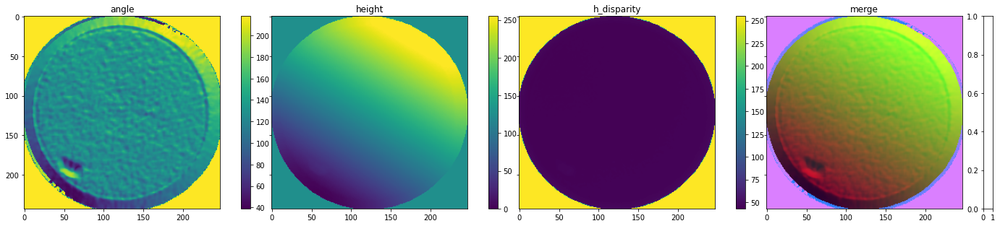

In [5]:
camera_matrix = getCameraParam('depth')
o_impl_hha = getHHA(camera_matrix, raw_frames[0], raw_frames[0])
plot_tri_channel(o_impl_hha, labels=['angle', 'height', 'h_disparity', 'merge'])

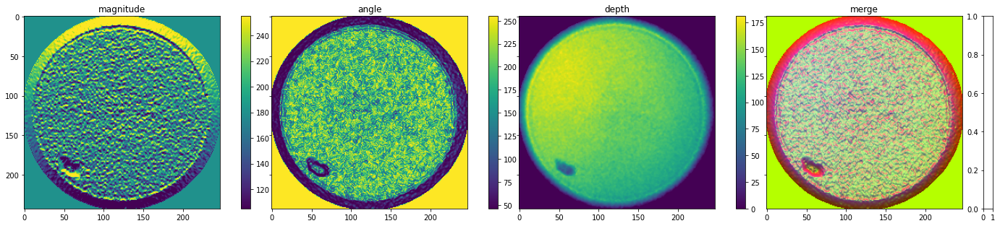

In [6]:

encoder2 = HHAEncoder(crop_bground_im, gradient_step=1, mode='amd')
im = encoder2.encode(raw_frames[0])
#im[:,:,2] = np.abs(im[:,:,2])
plot_tri_channel(im, labels=['magnitude', 'angle', 'depth', 'merge'])

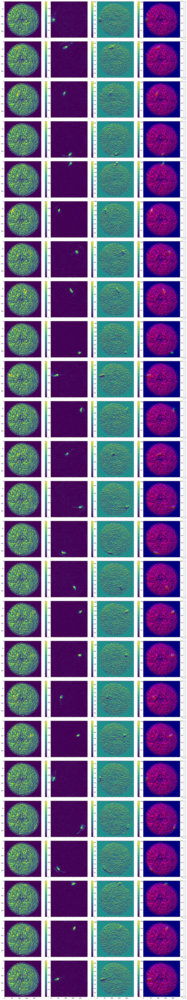

In [14]:
hha_frames = []
for rf in raw_frames:
    hha_frames.append(encoder2.encode(rf))

plot_multi_tri_channel(np.array(hha_frames))


In [9]:
%prun encoder2.encode(raw_frames[0])

         260 function calls (244 primitive calls) in 0.009 seconds

   Ordered by: internal time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.003    0.003    0.007    0.007 1710658854.py:21(compute_normals)
        5    0.001    0.000    0.001    0.000 {method 'reduce' of 'numpy.ufunc' objects}
        2    0.001    0.000    0.001    0.000 {Sobel}
        1    0.001    0.001    0.001    0.001 function_base.py:814(gradient)
     23/7    0.001    0.000    0.004    0.001 {built-in method numpy.core._multiarray_umath.implement_array_function}
        3    0.001    0.000    0.001    0.000 proc.py:208(scale_raw_frames)
        1    0.001    0.001    0.001    0.001 linalg.py:2363(norm)
        5    0.000    0.000    0.000    0.000 {method 'astype' of 'numpy.ndarray' objects}
        1    0.000    0.000    0.009    0.009 1710658854.py:69(encode)
        1    0.000    0.000    0.001    0.001 1710658854.py:59(compute_height)
        1    0.000    0.000 

In [10]:
%%timeit -n 1000 -r 3
encoder2.encode(raw_frames[0])

5.99 ms ± 128 µs per loop (mean ± std. dev. of 3 runs, 1000 loops each)


(250, 251)
(250, 250)
(250,)
(251, 251)


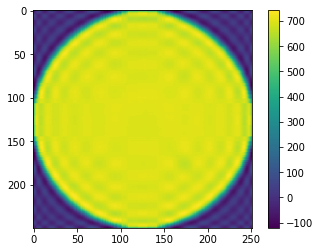

In [19]:
u,s,v = np.linalg.svd(raw_frames[0])
n = 10
S = np.zeros(np.shape(raw_frames[0]))
for i in range(0, n):
    S[i,i] = s[i]
print(raw_frames[0].shape)
print(u.shape)
print(s.shape)
print(v.shape)
plt.imshow(u @ S @ v)
plt.colorbar()

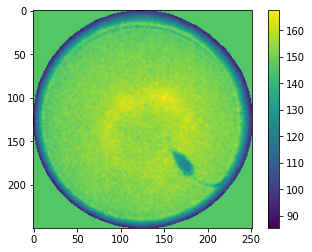

In [32]:
from sklearn.decomposition import PCA

pca = PCA(1)
data = pca.fit_transform(raw_frames[0].reshape(-1, 1))
data = data.reshape(raw_frames[0].shape)
data[data > 0] = np.mean(data[data < 0])
data = np.abs(data)
plt.imshow(data)
plt.colorbar()

c:\Users\Josh\anaconda3\envs\moseq-detectron\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

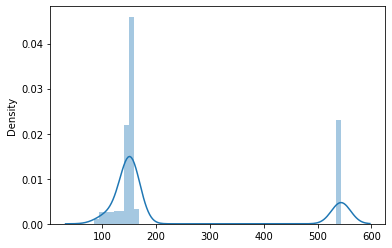

In [31]:
sns.distplot(data)